# **Домашнее задание №1 (base). Часть 1**

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;

**Максимальная оценка за дз**
> Оценка за первую часть домашки = $min(\text{ваш балл}, 7)$


**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.**

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [1]:
!pip install -U ydata-profiling

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
from ydata_profiling import ProfileReport
import pickle
import os

random.seed(42)
np.random.seed(42)



In [3]:
model_dir = 'models'
os.makedirs(model_dir, exist_ok=True)

def save_pickle_file(model, file_name):
  model_path = os.path.join(model_dir, file_name)
  with open(model_path, 'wb') as f:
    pickle.dump(model, f, protocol=pickle.HIGHEST_PROTOCOL)

Давайте зафиксируем важный момент.

**Задание 0 (0 баллов).**
Изучите и ответье на вопрос: для чего фиксируем сиды в домашках?

Это нужно для того, чтобы при каждом запуске мы получали один и тот же результат, а не что-то рандомное. Например, чтобы другой человек при запуске мог видеть те же результаты, что и мы. Либо, чтобы при дебаге мы всегда полагались на один и тот же результат, и могли сравнить выходные данные.

# **Часть 1 | EDA и визуализация**

Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (2.5 балла)
- Визуализации признаков и их анализ (1 балл)

Всего можно набрать 3.5 основных балла и 0.65 бонусных. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (2.5 балла)**

In [4]:
import pandas as pd

In [5]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1 (0.5 балла)**

Вы уже встречались с pandas в первой половине семестра. Теперь будем постоянно (кроме некоторых случаев) использовать его для анализа данных и наслаивать навыки. Выполните операции, направленные на практику основных действий с `pandas`:

**0.1 балла**
- [ ] Отобразите 30 случайных строк тренировочного датасета.
- [ ] Отобразите первые 5 и последние 5 объектов тестового датасета
- [ ] Посмотрите, есть ли в датасете пропуски. Запишите/выведите названия колонок, для которых есть пропущенные значения
- [ ] Посмотрите, есть ли в данных явные дубликаты


**0.2 балла**
Ответьте на вопросы:
- [ ] Выводы о чем можно сделать, используя случайные/верхние/нижние строки? А о чем нельзя?
- [ ] Достаточно ли метода duplicated для анализа дубликатов? Почему?

**0.15 балла**
- [ ] Постройте дашборд, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)

In [6]:
# 30 случайных строк тренировочного датасета
df_train.iloc[random.sample(range(df_train.shape[0]), 30)]


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
5238,Ford Freestyle Trend Diesel BSIV,2018,675000,60000,Diesel,Individual,Manual,First Owner,24.4 kmpl,1498 CC,98.63 bhp,215Nm@ 1750-3000rpm,5.0
912,Mercedes-Benz E-Class E250 CDI Avantgarde,2016,2900000,31000,Diesel,Dealer,Automatic,First Owner,13.0 kmpl,2143 CC,204 bhp,500Nm@ 1600-1800rpm,5.0
204,Hyundai Creta 1.6 CRDi SX Plus Dual Tone,2017,1100000,37000,Diesel,Individual,Manual,First Owner,19.67 kmpl,1582 CC,126.2 bhp,259.9Nm@ 1900-2750rpm,5.0
6074,Toyota Innova 2.5 E Diesel MS 8-seater,2007,409999,248119,Diesel,Individual,Manual,Fourth & Above Owner,12.8 kmpl,2494 CC,102 bhp,20.4@ 1400-3400(kgm@ rpm),8.0
2253,Maruti Wagon R LXI CNG,2011,200000,137000,CNG,Individual,Manual,First Owner,26.2 km/kg,998 CC,58.2 bhp,77Nm@ 3500rpm,5.0
2006,Maruti Wagon R LXI BS IV,2016,350000,70000,Petrol,Individual,Manual,First Owner,20.51 kmpl,998 CC,67.04 bhp,90Nm@ 3500rpm,5.0
1828,Maruti Swift Dzire LDi,2010,215000,120000,Diesel,Individual,Manual,Third Owner,19.3 kmpl,1248 CC,73.9 bhp,190Nm@ 2000rpm,5.0
1143,Maruti Celerio VDi,2015,250000,100000,Diesel,Individual,Manual,Second Owner,27.62 kmpl,793 CC,47 bhp,125Nm@ 2000rpm,5.0
6033,Hyundai i20 Sportz 1.2,2013,315000,49000,Petrol,Individual,Manual,Second Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
839,Maruti Wagon R VXI BS IV,2011,200000,94000,Petrol,Individual,Manual,Third Owner,18.9 kmpl,998 CC,67.1 bhp,90Nm@ 3500rpm,5.0


In [7]:
# Первые 5 объектов тестового датасета
df_test.head(5)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0 kmpl,2498 CC,112 bhp,260 Nm at 1800-2200 rpm,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5 kmpl,1497 CC,108.5 bhp,260Nm@ 1500-2750rpm,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9 kmpl,1799 CC,130 bhp,172Nm@ 4300rpm,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5 kmpl,1172 CC,65 bhp,96 Nm at 3000 rpm,5.0


In [8]:
# Последние 5 объектов тестового датасета
df_test.tail(5)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81 kmpl,1086 CC,68.05 bhp,99.04Nm@ 4500rpm,5.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36 kmpl,1197 CC,78.9 bhp,111.8Nm@ 4000rpm,5.0
999,Honda City i DTec SV,2016,700000,110000,Diesel,Individual,Manual,First Owner,26.0 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0


In [9]:
# Посмотрите, есть ли в датасете пропуски. Запишите/выведите названия колонок, для которых есть пропущенные значения

# https://python4data.science/en/latest/clean-prep/nulls.html#2.4-Find-all-columns-with-missing-data
print("Колонки с пропущенными значениями в трейне:")
print(list(df_train.columns[df_train.isnull().any()]))
print("Колонки с пропущенными значениями в трейне:")
print(list(df_test.columns[df_train.isnull().any()]))

Колонки с пропущенными значениями в трейне:
['mileage', 'engine', 'max_power', 'torque', 'seats']
Колонки с пропущенными значениями в трейне:
['mileage', 'engine', 'max_power', 'torque', 'seats']


In [10]:
# Посмотрите, есть ли в данных явные дубликаты
train_duplicated = df_train[df_train.duplicated()]
print("Количество дупликатов в трейне: ", train_duplicated.shape[0])
train_duplicated.head(5)

Количество дупликатов в трейне:  985


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
254,Hyundai Grand i10 Sportz,2017,450000,35000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,82 bhp,114Nm@ 4000rpm,5.0
258,Maruti Swift VXI,2012,330000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.0
324,Jaguar XE 2016-2019 2.0L Diesel Prestige,2017,2625000,9000,Diesel,Dealer,Automatic,First Owner,13.6 kmpl,1999 CC,177 bhp,430Nm@ 1750-2500rpm,5.0
325,Lexus ES 300h,2019,5150000,20000,Petrol,Dealer,Automatic,First Owner,22.37 kmpl,2487 CC,214.56 bhp,202Nm@ 3600-5200rpm,5.0
326,Jaguar XF 2.0 Diesel Portfolio,2017,3200000,45000,Diesel,Dealer,Automatic,First Owner,19.33 kmpl,1999 CC,177 bhp,430Nm@ 1750-2500rpm,5.0


In [11]:
test_duplicated = df_test[df_test.duplicated()]
print("Количество дупликатов в тесте: ", test_duplicated.shape[0])
test_duplicated.head(5)

Количество дупликатов в тесте:  62


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
200,Maruti Swift AMT VVT VXI,2019,650000,5621,Petrol,Trustmark Dealer,Automatic,First Owner,22.0 kmpl,1197 CC,81.80 bhp,113Nm@ 4200rpm,5.0
235,Hyundai Grand i10 1.2 CRDi Sportz,2017,450000,56290,Diesel,Dealer,Manual,First Owner,24.0 kmpl,1186 CC,73.97 bhp,190.24nm@ 1750-2250rpm,5.0
238,Toyota Camry 2.5 Hybrid,2016,2000000,68089,Petrol,Trustmark Dealer,Automatic,First Owner,19.16 kmpl,2494 CC,157.7 bhp,213Nm@ 4500rpm,5.0
253,Tata Safari Storme EX,2015,503000,110000,Diesel,Individual,Manual,First Owner,14.1 kmpl,2179 CC,147.94 bhp,320Nm@ 1500-3000rpm,7.0
269,Jaguar XF 2.0 Diesel Portfolio,2017,3200000,45000,Diesel,Dealer,Automatic,First Owner,19.33 kmpl,1999 CC,177 bhp,430Nm@ 1750-2500rpm,5.0


*Выводы о чем можно сделать, используя случайные/верхние/нижние строки? А о чем нельзя?*

Используя случайные/верхние/нижние строки, мы можем просто увидеть, в каком формате представлены данные, какие есть колонки, какие в них могут быть значения. Нельзя сделать какие-то статистические выводы. Например, среднее/минимум/максимум в столбце, есть ли дупликаты и тп. Также не всегда можно сделать вывод, присутствует ли nan.

*Достаточно ли метода duplicated для анализа дубликатов? Почему?*

duplicated показывает, есть ли в датасете идентичная строчка. Но он не дает информации о том, сколько есть дупликатов, какие индексы они имеют и тп.

In [12]:
# Постройте дашборд, используя ydata-profilling

train_profile = ProfileReport(df_train, title="Train Profiling Report")
train_profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:01<00:00, 10.64it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [13]:
test_profile = ProfileReport(df_test, title="Test Profiling Report")
test_profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:00<00:00, 13.60it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Мы обнаружили пропуски. Давайте избавимся от них.

**(0.05 балла)**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось. Заполнение пропусков проводите для обоих наборов данных, если необходимо

**Важно!**

При заполнении пропусков и в тестовом, и тренировочном наборах данных вы определяетесь со стратегией предобработки пропущенных значений при потенциальной работе модели.

Так как в теоретическом случае вы не имеете доступа к тестовой выборке, то заполняемой значение (у нас — медиана) вы считаете про *тренировочному* набору данных и им же заполняете *тестовый*.

In [14]:
# https://python4data.science/en/latest/clean-prep/nulls.html#2.5-Replacing-missing-data

train_missing_columns = list(df_train.columns[df_train.isnull().any()])
print(df_train[train_missing_columns].dtypes)
df_train.head(1)[train_missing_columns]

# Нужно сделать из object числовые признаки для поиска медианы

mileage       object
engine        object
max_power     object
torque        object
seats        float64
dtype: object


,mileage,engine,max_power,torque,seats
0,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0


In [15]:
# Для начала уберем единицы измерения для признаков mileage, engine, max_power и удалим 'torque' (задание 3)

# https://stackoverflow.com/questions/71381092/removing-units-of-measurement-from-a-database-python

def drop_column(df, column):
  if column in set(df.columns): # если уже запускали ячейку
    df.drop([column], axis=1, inplace=True)

def remove_units_of_measurements(df, columns):
  for col in columns:
    df[col] = df[col].astype('str').str.extract(r'(\d+.\d+)',).astype('float')

columns = ['mileage', 'engine', 'max_power']

remove_units_of_measurements(df_train, columns)
drop_column(df_train, 'torque')

remove_units_of_measurements(df_test, columns)
drop_column(df_test, 'torque')

df_train.head(5)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,NaN,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,NaN,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,5.0


In [16]:
# Теперь заменяем на медиану:

def nan_to_median(df, medians):
  missing_columns = list(df.columns[df.isnull().any()])
  values = {}
  for col in missing_columns:
    values[col] = medians[col]
  df.fillna(value=values, inplace=True)

medians = df_train.median(numeric_only=True)

nan_to_median(df_train, medians)
nan_to_median(df_test, medians)


### **Задание 2 (0.5 балла)**

На прошлом шаге вы рассмотрели дубликаты. Однако дубликат может быть связан с не только полным повторением информации в нескольких строках, но и частиным. Например, объект мог был внесен в базу данных с разным значением целевой переменной. В этом шаге займемся такими дублями!

**Ваши действия:**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.1 балла)
- [ ] Отобразите такие объекты (0.15 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.15 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.1 балла)


In [17]:
# Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить).

df_train_without_price = df_train.drop(['selling_price'], axis=1)
train_duplicated = df_train_without_price[df_train_without_price.duplicated()]
print("Количество дупликатов в трейне: ", train_duplicated.shape[0])

# Отобразите такие объекты
train_duplicated.head(5)

Количество дупликатов в трейне:  1159


,name,year,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
254,Hyundai Grand i10 Sportz,2017,35000,Petrol,Individual,Manual,First Owner,18.90,1197.0,88.70,5.0
258,Maruti Swift VXI,2012,50000,Petrol,Individual,Manual,Second Owner,18.60,1197.0,85.80,5.0
268,Maruti Swift Dzire VXI,2014,70000,Petrol,Individual,Manual,Second Owner,19.10,1197.0,85.80,5.0
324,Jaguar XE 2016-2019 2.0L Diesel Prestige,2017,9000,Diesel,Dealer,Automatic,First Owner,13.60,1999.0,177.00,5.0
325,Lexus ES 300h,2019,20000,Petrol,Dealer,Automatic,First Owner,22.37,2487.0,214.56,5.0


In [18]:
# Удалите повторяющиеся строки.
# Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю
subset = list(df_train_without_price.columns)
df_train.drop_duplicates(subset, keep='first', inplace=True)
df_train.shape

(5840, 12)

In [19]:
assert df_train.shape == (5840, 12) # поставила 12 вместо 13, так как удалила torque

In [20]:
#  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков
df_train.reset_index()

,index,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,88.70,5.0
1,1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,5.0
2,2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,88.70,5.0
3,3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,5.0
4,4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,6992,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92,1086.0,62.10,5.0
5836,6993,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.90,998.0,67.10,5.0
5837,6994,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.50,1197.0,82.85,5.0
5838,6995,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493.0,110.00,5.0


Отлично! Мы избавились от маленьких и явных проблем. Теперь перейдем к более сложным недостаткам полученной таблицы.

### **Задание 3 (0.25 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Удалите столбец ``torque``


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.
- Стобец ``torque`` мы удаляем для простоты. В идеальном случае, его также стоило бы предобработать.

In [21]:
# Уже сделали в предыдущем задании

### **Задание 4 (0.1 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.

In [22]:
def float_col_to_int(df, columns):
  for col in columns:
    df[col] = df[col].astype('int')

float_col_to_int(df_train, ['engine', 'seats'])
float_col_to_int(df_test, ['engine', 'seats'])

### **Задание 5 (0.15 балла)**

Отлично! Мы провели "косметическую" предобработку и теперь готовы сделать важный шаг в контексте анализа данных. А именно — посмотреть на статистики!

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сделайте вывод.

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

**Примечание:**

Более корректно рассматривать статистики до заполнения пропусков и после, чтобы убедиться, что мы не внесли каких-либо серьезных сдвигов в изначальные рапсределения.

## Статистики по числовым столбцам:

In [23]:
# Основные статистики по числовым столбцам для трейна ДО заполнения пропусков

df_train_copy = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_train_copy.describe(include=np.number)


,year,selling_price,km_driven,seats
count,6999.000000,6.999000e+03,6.999000e+03,6797.000000
mean,2013.818403,6.395152e+05,6.958462e+04,5.419008
std,4.053095,8.089419e+05,5.772400e+04,0.965767
min,1983.000000,2.999900e+04,1.000000e+00,2.000000
25%,2011.000000,2.549990e+05,3.500000e+04,5.000000
50%,2015.000000,4.500000e+05,6.000000e+04,5.000000
75%,2017.000000,6.750000e+05,9.700000e+04,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,14.000000


In [24]:
# Основные статистики по числовым столбцам для трейна ПОСЛЕ заполнения пропусков

df_train.describe(include=np.number)

,year,selling_price,km_driven,mileage,engine,max_power,seats
count,5840.000000,5.840000e+03,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,5.229601e+05,7.395224e+04,19.428611,1429.448973,92.517015,5.426712
std,4.095622,5.354320e+05,6.007114e+04,3.986026,485.662834,29.484939,0.982344
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,32.800000,2.000000
25%,2011.000000,2.500000e+05,3.900000e+04,16.950000,1197.000000,81.800000,5.000000
50%,2014.000000,4.050000e+05,7.000000e+04,19.300000,1248.000000,88.700000,5.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.300000,1498.000000,98.960000,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.000000,400.000000,14.000000


In [25]:
# Основные статистики по числовым столбцам для теста ДО заполнения пропусков

df_test_copy = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')
df_test_copy.describe(include=np.number)

,year,selling_price,km_driven,seats
count,1000.000000,1.000000e+03,1000.000000,981.000000
mean,2013.681000,6.179010e+05,71393.341000,5.410805
std,4.012149,7.585539e+05,48486.218662,0.919985
min,1995.000000,3.100000e+04,1303.000000,4.000000
25%,2011.000000,2.500000e+05,37000.000000,5.000000
50%,2014.000000,4.349990e+05,61500.000000,5.000000
75%,2017.000000,6.700000e+05,100000.000000,5.000000
max,2020.000000,6.000000e+06,375000.000000,9.000000


In [26]:
# Основные статистики по числовым столбцам для теста ПОСЛЕ заполнения пропусков

df_test.describe(include=np.number)

,year,selling_price,km_driven,mileage,engine,max_power,seats
count,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.00000,1000.00000,1000.000000
mean,2013.681000,6.179010e+05,71393.341000,19.337480,1454.87600,95.15773,5.403000
std,4.012149,7.585539e+05,48486.218662,3.951751,521.99574,32.58409,0.912921
min,1995.000000,3.100000e+04,1303.000000,0.000000,624.00000,34.20000,4.000000
25%,2011.000000,2.500000e+05,37000.000000,16.550000,1197.00000,81.80000,5.000000
50%,2014.000000,4.349990e+05,61500.000000,19.300000,1248.00000,88.70000,5.000000
75%,2017.000000,6.700000e+05,100000.000000,22.300000,1582.00000,102.00000,5.000000
max,2020.000000,6.000000e+06,375000.000000,32.260000,3604.00000,280.00000,9.000000


## Статистики по категориальным столбцам:

In [27]:
# Основные статистики по категориальным столбцам для трейна ДО заполнения пропусков

df_train_copy.describe(include=object)

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,6999,6999,6999,6999,6999,6797,6797,6803,6796
unique,1924,4,3,2,5,386,120,316,419
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner,18.9 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm
freq,116,3793,5826,6095,4587,197,885,330,468


In [28]:
# Основные статистики по категориальным столбцам для трейна ПОСЛЕ заполнения пропусков

df_train.describe(include=object)

,name,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840,5840
unique,1924,4,3,2,5
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner
freq,91,3177,5223,5336,3603


In [29]:
# Основные статистики по категориальным столбцам для теста ДО заполнения пропусков

df_test_copy.describe(include=object)

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,1000,1000,1000,1000,1000,981,981,981,981
unique,621,4,3,2,5,237,88,182,226
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner,18.6 kmpl,1248 CC,74 bhp,200Nm@ 1750rpm
freq,15,534,837,877,623,23,116,43,57


In [30]:
# Основные статистики по категориальным столбцам для теста ПОСЛЕ заполнения пропусков

df_test.describe(include=object)

,name,fuel,seller_type,transmission,owner
count,1000,1000,1000,1000,1000
unique,621,4,3,2,5
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner
freq,15,534,837,877,623


In [31]:
assert df_train.shape == (5840, 12) # 13 было заменено на 12, так как удалили столбец

### Вывод:
Судя по статистикам min/max и квантилям, выбросов в данных нет.
Если сравнивать с датасетами до обработки, мы не внесли каких-либо серьезных сдвигов в изначальные рапсределения.

## **Визуализации (1 балл + 0.5 бонус)**



Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 6 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

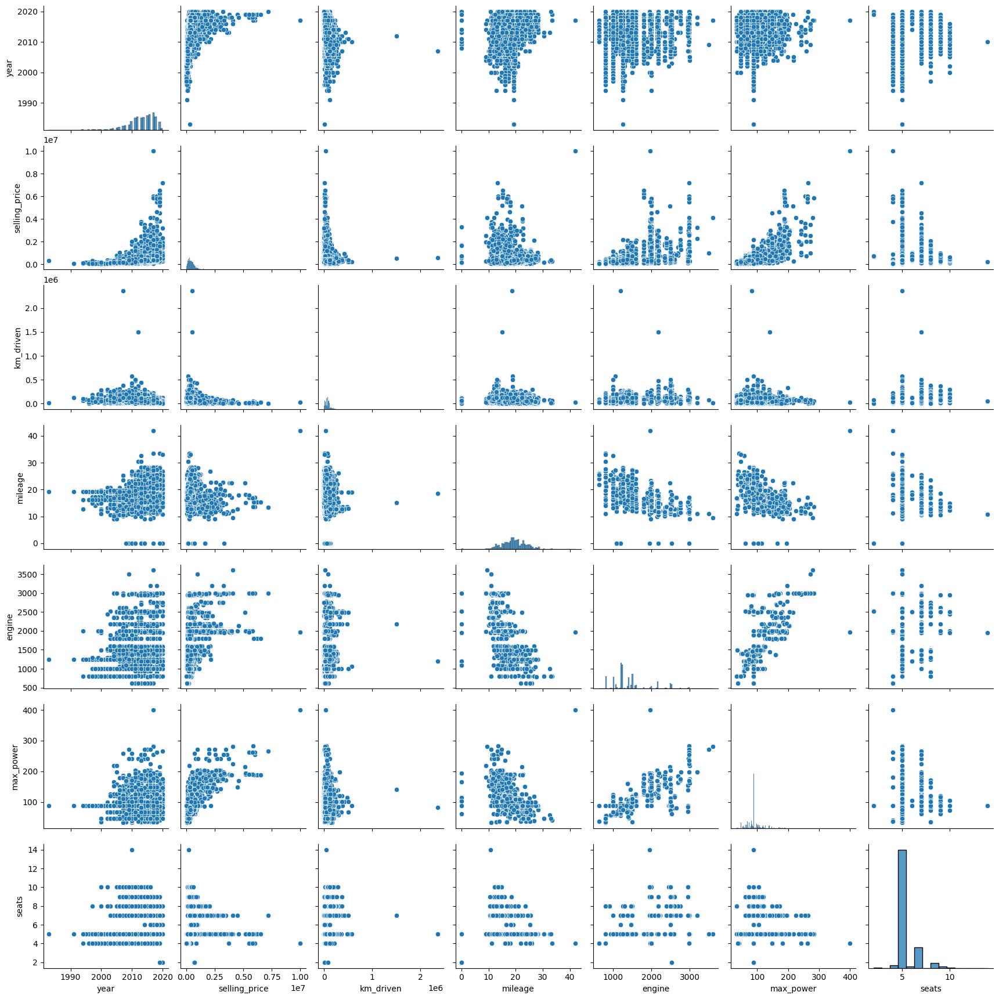

In [32]:
sns.pairplot(df_train)

*Можно ли предположить на основе распределений связь признаков с целевой переменной?*

Для некоторых числовых переменных, да, зависит от того, как выглядит график.  Например, для `selling_price` и `year` видно, что чем больше один из признаков, тем больше другой. Для `selling_price` и `km_driven` - наоборот. Но например, чисто визуально для `selling_price` и `milleage` - очевидной связи нет.

*Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?*

Да, можно, но, аналогично, зависит от графика. Если точки более-менее "хаотичны", то можно предположить, что корреляции нет. Если точки расположены визуально "около" прямой, то можно выдвинуть гипотезу о положительной/отрицательной корреляции в зависимости от наклона этой прямой.

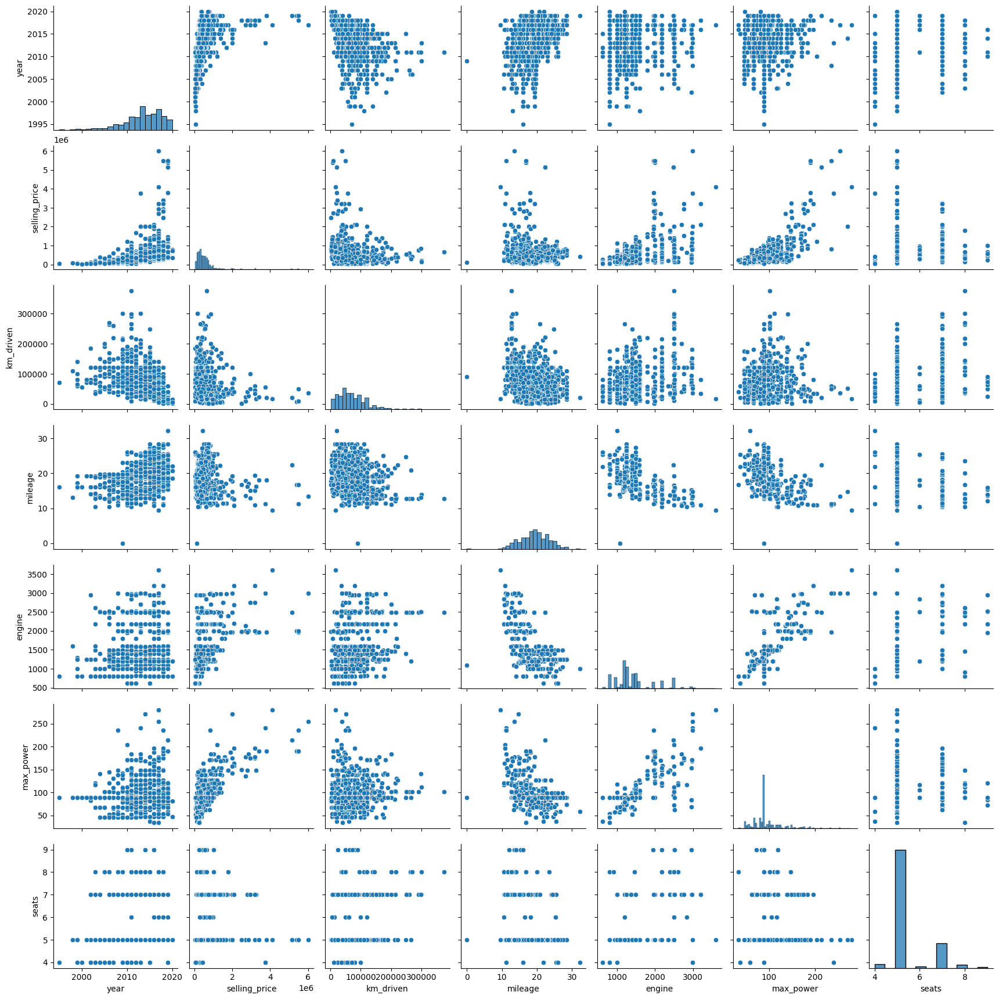

In [33]:
sns.pairplot(df_test)

*Похожими ли оказались совокупности при разделении на трейн и тест?*

Для меня визуально - оказались. В некоторых графиках немного разный масштаб, но в целом все выглядит похоже.

### **Задание 7 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)


In [34]:
train_corr = df_train.corr(numeric_only=True)
train_corr

,year,selling_price,km_driven,mileage,engine,max_power,seats
year,1.000000,0.427279,-0.368966,0.342172,0.002819,0.067379,0.041178
selling_price,0.427279,1.000000,-0.164828,-0.104458,0.447672,0.671100,0.149953
km_driven,-0.368966,-0.164828,1.000000,-0.182245,0.229766,0.044838,0.192328
mileage,0.342172,-0.104458,-0.182245,1.000000,-0.572677,-0.409614,-0.450810
engine,0.002819,0.447672,0.229766,-0.572677,1.000000,0.674366,0.652172
max_power,0.067379,0.671100,0.044838,-0.409614,0.674366,1.000000,0.227225
seats,0.041178,0.149953,0.192328,-0.450810,0.652172,0.227225,1.000000


<Axes: >

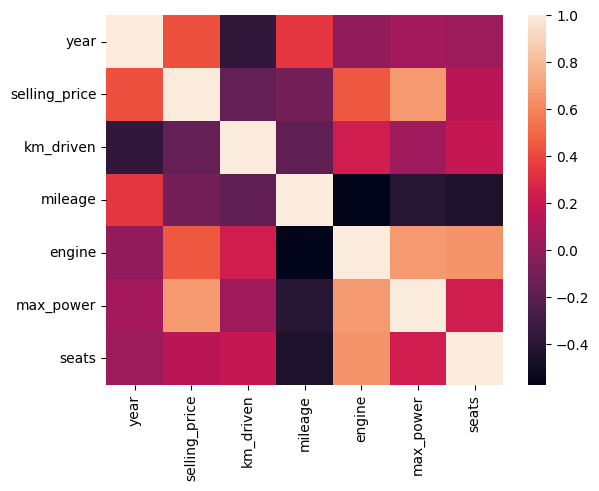

In [35]:
sns.heatmap(train_corr)

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

*Какие 2 признака наименее скоррелированы между собой?*

`year` и `engine` со значением 0.002819.

*Между какими наблюдается довольно сильная положительная линейная зависимость?*

`max_power` и `engine`, `selling_price` и `max_power` - чуть больше 0,67.

*Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?*

Учитывая, что их корреляция отрицательна и равна около -0.37, то да.

### **Бонус (0.5 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их **и поясните.**

- Каждая дополнительная визуализация может принести до 0.25 баллов при условии, что она обоснована.

In [36]:
# your code here

# **Часть 2 | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.25 балла;

### **Задание 8 (0.05 балла)**

Сделайте тренировочный и тестовый наборы. Сделайте на тренировочный и тестовый наборы. Она уже даны, достаточно просто отделить целевой признак Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных. Используйте уже имеющиеся данные train и test при разбиении. Если считаете уместным применить какую-то более хитрую технику разбиения — примените, но опишите, зачем.

In [37]:
y_train = df_train['selling_price']
X_train = df_train.select_dtypes(include=np.number).drop(['selling_price'], axis=1)
# В задании не очень понятно, нужно удалять seats или нет. Я оставила

In [38]:
# опишите выбранные вещественные признаки

X_train.describe()

,year,km_driven,mileage,engine,max_power,seats
count,5840.000000,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,7.395224e+04,19.428611,1429.448973,92.517015,5.426712
std,4.095622,6.007114e+04,3.986026,485.662834,29.484939,0.982344
min,1983.000000,1.000000e+00,0.000000,624.000000,32.800000,2.000000
25%,2011.000000,3.900000e+04,16.950000,1197.000000,81.800000,5.000000
50%,2014.000000,7.000000e+04,19.300000,1248.000000,88.700000,5.000000
75%,2017.000000,1.000000e+05,22.300000,1498.000000,98.960000,5.000000
max,2020.000000,2.360457e+06,42.000000,3604.000000,400.000000,14.000000


In [39]:
y_test = df_test['selling_price']
X_test = df_test.select_dtypes(include=np.number).drop(['selling_price'], axis=1)

### **Задание 9 (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [40]:
df_train['selling_price'].describe()

,selling_price
count,5.840000e+03
mean,5.229601e+05
std,5.354320e+05
min,2.999900e+04
25%,2.500000e+05
50%,4.050000e+05
75%,6.400000e+05
max,1.000000e+07


In [41]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

def print_metrics(y_test, y_pred):
  print("Mean squared error: %.2f" %  MSE(y_test, y_pred))
  print("Coefficient of determination: %.2f" % r2_score(y_test, y_pred))

def predict_and_describe(model, X_test, y_test):
  y_pred = model.predict(X_test)
  print_metrics(y_test, y_pred)
  return y_pred

lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)

print("Для модели линейной регрессии:")
y_pred_lin_reg = predict_and_describe(lin_reg, X_test, y_test)

save_pickle_file(lin_reg, 'linear_model.pkl')


Для модели линейной регрессии:
Mean squared error: 224463626850.61
Coefficient of determination: 0.61


In [42]:
print("Coefficient of determination: %.2f" % r2_score(y_test, y_pred_lin_reg * 0 + y_train.mean()))

Coefficient of determination: -0.02


MSE получилось чуть больше $2⋅10^{11}$. Так как `selling_price` - число порядка 6-7, то такой результат ожидаем. Для значения $R^2$ 0,61 - достаточно хороший результат (если сравнивать со средним, например).

### **Задание 10 (0.15 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [43]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

lin_reg_scaled = LinearRegression()
lin_reg_scaled.fit(X_train_scaled, y_train)

print("Для модели линейной регрессии со стандартизацией признаков:")
y_pred_scaled = predict_and_describe(lin_reg_scaled, X_test_scaled, y_test)
save_pickle_file(lin_reg, 'linear_model_standart.pkl')

Для модели линейной регрессии со стандартизацией признаков:
Mean squared error: 224463626850.61
Coefficient of determination: 0.61


### **Задание 11 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [44]:
def print_coefs(lin_reg):
  print(*list(zip(lin_reg.coef_, X_train.columns)), sep='\n')

print("Признаки без стандартизации:")
print_coefs(lin_reg)
print()
print("Признаки со стандартизацией:")
print_coefs(lin_reg_scaled)

Признаки без стандартизации:
(np.float64(43977.635616125976), 'year')
(np.float64(-0.670476981270069), 'km_driven')
(np.float64(8911.953691632634), 'mileage')
(np.float64(118.29338952540564), 'engine')
(np.float64(11134.952678542853), 'max_power')
(np.float64(-15712.550750114626), 'seats')

Признаки со стандартизацией:
(np.float64(180100.34797523136), 'year')
(np.float64(-40272.8658026154), 'km_driven')
(np.float64(35520.23898346124), 'mileage')
(np.float64(57445.78380979573), 'engine')
(np.float64(328285.2925971817), 'max_power')
(np.float64(-15433.807613157225), 'seats')


Наиболее информативный признак со стандартизацией - `max_power`.

### **Задание 12 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [45]:
from sklearn.linear_model import Lasso

lasso = Lasso()
lasso.fit(X_train_scaled, y_train)
print("Для модели Lasso регрессии со стандартизацией признаков:")
y_pred_lasso = predict_and_describe(lasso, X_test_scaled, y_test)

print("\nПризнаки со стандартизацией:")
print_coefs(lasso)

save_pickle_file(lin_reg, 'lasso.pkl')

Для модели Lasso регрессии со стандартизацией признаков:
Mean squared error: 224464302136.22
Coefficient of determination: 0.61

Признаки со стандартизацией:
(np.float64(180100.2647708103), 'year')
(np.float64(-40271.7404739216), 'km_driven')
(np.float64(35518.34621113461), 'mileage')
(np.float64(57441.12815624987), 'engine')
(np.float64(328285.9685412008), 'max_power')
(np.float64(-15430.991202902424), 'seats')


MSE стало немного хуже, $R^2$ не изменилось.

loss для Lasso:

(1 / (2 * n_samples)) * ||y - Xw||^2_2 + alpha * ||w||_1

По умолчанию `alpha=1`, поэтому первое слагаемое имеет порядок O(порядок y^2), второе - порядок O(порядок y). Чтобы второе слагаемое имело вес одного порядка с первым, нужно чтобы `alpha` было порядка y. Поэтому, L1-регуляризация вносит значительно меньший вклад в сумму и не зануляет веса. Попробуем увеличить `aplha`:

In [46]:
lasso_10000 = Lasso(alpha=10000)
lasso_10000.fit(X_train_scaled, y_train)

print("Для модели Lasso регрессии с aplha=10000:")
y_pred_lasso_10000 = predict_and_describe(lasso_10000, X_test_scaled, y_test)

print()
print_coefs(lasso_10000)

Для модели Lasso регрессии с aplha=10000:
Mean squared error: 231246148320.01
Coefficient of determination: 0.60

(np.float64(181015.66155406128), 'year')
(np.float64(-28593.092655951452), 'km_driven')
(np.float64(14359.675612589654), 'mileage')
(np.float64(21637.106374475436), 'engine')
(np.float64(329673.4690489026), 'max_power')
(np.float64(-0.0), 'seats')


Видно, что один из весов занулился, но качество стало хуже.

### **Задание 13 Финальный рывок (0.5 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [47]:
from sklearn.model_selection import GridSearchCV

search_lasso = GridSearchCV(Lasso(), {'alpha': [10**p for p in range(10)]})
search_lasso.fit(X_train_scaled, y_train)

def print_grid(search):
  print("Best params:", search.best_params_)
  print("Best score:", search_lasso.best_score_)

print("Для Lasso регрессии оптимальные параметры:")
print_grid(search_lasso)

save_pickle_file(lin_reg, 'optimal_lasso.pkl')

Для Lasso регрессии оптимальные параметры:
Best params: {'alpha': 10000}
Best score: 0.5916516673099042


In [48]:
print("Веса:")
print_coefs(search_lasso.best_estimator_)

Веса:
(np.float64(181015.66155406128), 'year')
(np.float64(-28593.092655951452), 'km_driven')
(np.float64(14359.675612589654), 'mileage')
(np.float64(21637.106374475436), 'engine')
(np.float64(329673.4690489026), 'max_power')
(np.float64(-0.0), 'seats')


In [49]:
print("Для модели Lasso регрессии с оптимальным aplha:")
y_pred_lasso = predict_and_describe(search_lasso, X_test_scaled, y_test)

Для модели Lasso регрессии с оптимальным aplha:
Mean squared error: 231246148320.01
Coefficient of determination: 0.60


Грид-сёрчу пришлось обучить 10 моделей, так как мы передали 10 параметров.

Лучший коэффициент регуляризации - 10000. У модели занулился вес seats.

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [50]:
from sklearn.linear_model import ElasticNet

search_elastic = GridSearchCV(ElasticNet(), {'alpha': 10.**np.linspace(-5, 5, 10), 'l1_ratio' : np.linspace(0.95, 1, 10)})
search_elastic.fit(X_train_scaled, y_train)

print("Для Elastic регрессии оптимальные параметры:")
print_grid(search_elastic)
print()
y_pred_elastic = predict_and_describe(search_elastic, X_test_scaled, y_test)

save_pickle_file(lin_reg, 'optimal_elastic.pkl')


Для Elastic регрессии оптимальные параметры:
Best params: {'alpha': np.float64(3.593813663804626), 'l1_ratio': np.float64(0.9833333333333333)}
Best score: 0.5916516673099042

Mean squared error: 232469818822.82
Coefficient of determination: 0.60


Грид-серч обучил 100 моделей, так как перебирал 10*10 наборов параметров.

Лучшие гиперпараметры - `alpha = 3.594`, `l1_ratio = 0.983` .

# **Часть 3| Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.75 основных балла и 0.25 бонусных.


**Задание 14 (0.1 балла)** Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

В этом домашнем задании мы предлагаем удалить его.

**Ваша задача:**
- [ ] Удалить столбец`name`

In [51]:
X_train_cat = df_train.drop(['selling_price', 'name'], axis=1)

X_test_cat = df_test.drop(['selling_price', 'name'], axis=1)
assert X_train_cat.shape == (5840, 10)

В другом случае, конечно, мы могли бы предобработать данный столбец. В качестве бонуса предлагаем вам придумать и реализовать алгоритм предобработки.

**Бонус 0.25 балла**
- [ ] Предобработайте столбец `name`, чтобы избежать его удаления. Если предобработали столбец — можно закомментировать assert

In [52]:
def add_name(df, X):
  X_name = X.copy()
  X_name['name'] = df['name'].str.split().str[0]
  return X_name

X_train_cat_name = add_name(df_train, X_train_cat)
X_test_cat_name = add_name(df_test, X_test_cat)

Я решила оставить марку, так как она (по логике) должна влиять на цену. Судя по тому, что я увидела, могу предположить, что марка -  первое слово в `name`. Как видно ниже, то марок получилось 30 - достаточно много для OneHotEncoding. Хочу сравнить такой вариант и вариант совсем без `name`.

In [53]:
X_train_cat.describe(include='object')

,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840
unique,4,3,2,5
top,Diesel,Individual,Manual,First Owner
freq,3177,5223,5336,3603


In [54]:
X_train_cat_name.describe(include='object')

,fuel,seller_type,transmission,owner,name
count,5840,5840,5840,5840,5840
unique,4,3,2,5,30
top,Diesel,Individual,Manual,First Owner,Maruti
freq,3177,5223,5336,3603,1804


### **Задание 15 (0.4 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования. Обратите внимание, что во избежание мультиколлинеарности следует избавиться от одного из полученных столбцов при кодировании каждого признака методом OneHot.

In [55]:
from sklearn.preprocessing import OneHotEncoder # или можно использовать get_dummies из библиотеки pandas

# Здесь мне помогал chat gpt

def encode_cat(X_train_cat, X_test_cat, cat_features):
  encoder = OneHotEncoder(drop="first", sparse_output=False, handle_unknown="ignore")
  encoder.fit(X_train_cat[cat_features])
  train_ohe = encoder.transform(X_train_cat[cat_features])
  test_ohe = encoder.transform(X_test_cat[cat_features])

  ohe_columns = encoder.get_feature_names_out(cat_features)

  train_ohe_df = pd.DataFrame(train_ohe, columns=ohe_columns, index=X_train_cat.index)
  test_ohe_df = pd.DataFrame(test_ohe, columns=ohe_columns, index=X_test_cat.index)

  X_train_cat = pd.concat([X_train_cat.drop(columns=cat_features), train_ohe_df], axis=1)
  X_test_cat = pd.concat([X_test_cat.drop(columns=cat_features), test_ohe_df], axis=1)
  return X_train_cat, X_test_cat

cat_features = ['year', 'fuel', 'seller_type', 'transmission', 'owner', 'seats']
X_train_cat, X_test_cat = encode_cat(X_train_cat, X_test_cat, cat_features)

cat_features.append('name')
X_train_cat_name, X_test_cat_name = encode_cat(X_train_cat_name, X_test_cat_name, cat_features)



/usr/local/lib/python3.12/dist-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [6] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


In [56]:
X_train_cat.head(5)

,km_driven,mileage,engine,max_power,year_1991,year_1994,year_1995,year_1996,year_1997,year_1998,...,owner_Test Drive Car,owner_Third Owner,seats_4,seats_5,seats_6,seats_7,seats_8,seats_9,seats_10,seats_14
0,145500,23.40,1248,88.70,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,120000,21.14,1498,103.52,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,127000,23.00,1396,88.70,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,120000,16.10,1298,88.20,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,45000,20.14,1197,81.86,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [57]:
X_train_cat_name.head(5)

,km_driven,mileage,engine,max_power,year_1991,year_1994,year_1995,year_1996,year_1997,year_1998,...,name_Mercedes-Benz,name_Mitsubishi,name_Nissan,name_Peugeot,name_Renault,name_Skoda,name_Tata,name_Toyota,name_Volkswagen,name_Volvo
0,145500,23.40,1248,88.70,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,120000,21.14,1498,103.52,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,127000,23.00,1396,88.70,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,120000,16.10,1298,88.20,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,45000,20.14,1197,81.86,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### **Задание 16 (0.25 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [58]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

search_ridge = GridSearchCV(Ridge(), {'alpha': 10.**np.linspace(-2, 8, 10)}, scoring='r2')
search_ridge.fit(X_train_cat, y_train)

print("Для Ridge регрессии оптимальные параметры:")
print_grid(search_ridge)
print()
y_pred_ridge = predict_and_describe(search_ridge, X_test_cat, y_test)

save_pickle_file(lin_reg, 'optimal_ridge.pkl')

Для Ridge регрессии оптимальные параметры:
Best params: {'alpha': np.float64(0.1291549665014884)}
Best score: 0.5916516673099042

Mean squared error: 206925348017.55
Coefficient of determination: 0.64


In [59]:
search_ridge_name = GridSearchCV(Ridge(), {'alpha': 10.**np.linspace(-2, 8, 10)}, scoring='r2')
search_ridge_name.fit(X_train_cat_name, y_train)

print("Для Ridge с name регрессии оптимальные параметры:")
print_grid(search_ridge_name)
print()
y_pred_ridge_name = predict_and_describe(search_ridge_name, X_test_cat_name, y_test)

save_pickle_file(lin_reg, 'optimal_ridge_name.pkl')

Для Ridge с name регрессии оптимальные параметры:
Best params: {'alpha': np.float64(1.6681005372000592)}
Best score: 0.5916516673099042

Mean squared error: 123640407879.50
Coefficient of determination: 0.78


Да, качество прогноза удалось значительно улучшить, так как мы использовали дополнительные признаки.

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 17 (0.5 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какая лучше всего решает задачу бизнеса

In [60]:
def business_metric(y_true, y_pred):
    return y_pred[(y_true * 0.9 <= y_pred) & (y_pred <= 1.1 * y_true)].shape[0] / y_true.shape[0]

print(f"Метрика для линейной регрессии {business_metric(y_test, y_pred_lin_reg)}")
print(f"Метрика для стандантизированной линейной регрессии {business_metric(y_test, y_pred_scaled)}")
print(f"Метрика для Lasso {business_metric(y_test, y_pred_lasso)}")
print(f"Метрика для Elastic {business_metric(y_test, y_pred_elastic)}")
print(f"Метрика для Ridge {business_metric(y_test, y_pred_ridge)}")
print(f"Метрика для Ridge с name {business_metric(y_test, y_pred_ridge_name)}")

Метрика для линейной регрессии 0.226
Метрика для стандантизированной линейной регрессии 0.226
Метрика для Lasso 0.254
Метрика для Elastic 0.226
Метрика для Ridge 0.206
Метрика для Ridge с name 0.262


лучше всего решает задачу бизнеса - Ridge с оставлением марки (`name`).

# **<font color="green">Часть 5 | Создание интерактивного приложения на Streamlit (3 балла)</font>**

Вам необходимо создать интерактивное приложение на Streamlit, которое будет:

- Показывать основные информативные графики/гистограммы в рамках EDA (1 балл)
- На вход запрашивать csv-файл с признаками объектов или запрашивать признаки объекта в окошках для ввода, и применять на поступивших объектах модель (1 балл)
- Визуализировать веса обученной модели (1 балл)

# **Часть 6 | Оформление репозитория и оценка сервиса (3 балла)**

**Результаты вашей работы** необходимо разместить в своём GitHub-репозитории. В этот же репозиторий позже будет добавлена вторая часть.

Под результатами первой части понимаем следующее:

---

### Обязательные файлы:

1. **`.ipynb`-ноутбук** со всеми экспериментами:

   * полный EDA,
   * все шаги препроцессинга,
   * обучение и сравнение моделей,
   * сохранённые output’ы.

2. **`.pickle`-файл**, содержащий:

   * обученную модель (или пайплайн `scaler + model`);
   * параметры скейлинга;
   * любые числовые объекты, необходимые для инференса внутри Streamlit-приложения.

3. **`.md`-файл с выводами** о проделанной работе:

   * что было сделано (краткое описание каждого этапа);
   * какие результаты были получены (метрики + интерпретация);
   * что дало наибольший прирост качества;
   * что сделать не удалось и почему (это нормально и даже полезно);
   * **оценка разработанного сервиса**:

     * насколько приложение удобно в использовании;
     * что получилось визуализировать хорошо, а что — менее удачно;
     * какие ограничения или проблемы вы заметили;
     * какие улучшения планируете в следующей итерации.

По результатам второй части, ждем:

4. **Streamlit-приложение** (например, `app.py`), которое можно запустить командой:

   ```bash
   streamlit run app.py
   ```

**И ссылку на приложение в StreamlitHub.**

В приложении должно быть:

* отображение ключевых графиков EDA;
* ввод данных (CSV или ручной ввод);
* применение модели;
* визуализация весов/коэффициентов.



### **За что могут быть сняты баллы:**

* отсутствие `.pickle` с моделью / пайплайном;
* слабая или неполная аналитика в `.md`-файле;
* беспорядок в ноутбуке или неясная логика вычислений;
* отсутствие возможности запустить Streamlit-приложение.